## Using XGBOOST

### 4 weeks of data

In [2]:
import pandas as pd
from src.paths import TRANSFORMED_DATA_DIR

df = pd.read_parquet(TRANSFORMED_DATA_DIR / 'tabular_data.parquet')
df

,rides_previous_672_hour,rides_previous_671_hour,rides_previous_670_hour,rides_previous_669_hour,rides_previous_668_hour,rides_previous_667_hour,rides_previous_666_hour,rides_previous_665_hour,rides_previous_664_hour,rides_previous_663_hour,...,rides_previous_7_hour,rides_previous_6_hour,rides_previous_5_hour,rides_previous_4_hour,rides_previous_3_hour,rides_previous_2_hour,rides_previous_1_hour,pickup_hour,pickup_location_id,target_rides_next_hour
0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,2.0,0.0,0.0,...,2.0,0.0,1.0,0.0,0.0,0.0,0.0,2022-01-29,1,0.0
1,0.0,0.0,0.0,0.0,0.0,4.0,1.0,2.0,1.0,2.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2022-01-30,1,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,1.0,2.0,0.0,0.0,0.0,0.0,2022-01-31,1,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,2.0,1.0,0.0,1.0,1.0,0.0,0.0,2022-02-01,1,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-02-02,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89300,3.0,0.0,2.0,3.0,2.0,3.0,13.0,8.0,9.0,9.0,...,6.0,5.0,3.0,1.0,6.0,1.0,3.0,2022-12-27,265,3.0
89301,6.0,4.0,0.0,0.0,2.0,0.0,14.0,7.0,8.0,4.0,...,4.0,2.0,1.0,2.0,2.0,2.0,8.0,2022-12-28,265,1.0
89302,7.0,2.0,3.0,4.0,7.0,4.0,10.0,9.0,7.0,11.0,...,2.0,3.0,5.0,1.0,1.0,0.0,8.0,2022-12-29,265,3.0
89303,6.0,5.0,4.0,3.0,0.0,3.0,11.0,12.0,9.0,10.0,...,3.0,3.0,1.0,2.0,0.0,1.0,2.0,2022-12-30,265,7.0


In [3]:
from datetime import datetime
from src.data_split import train_test_split

X_train, y_train, X_test, y_test = train_test_split(
    df,
    cutoff_date=datetime(2022, 6, 1, 0, 0, 0),
    target_column_name='target_rides_next_hour'
)

print(f'{X_train.shape=}')
print(f'{y_train.shape=}')
print(f'{X_test.shape=}')
print(f'{y_test.shape=}')

X_train.shape=(32595, 674)
y_train.shape=(32595,)
X_test.shape=(56710, 674)
y_test.shape=(56710,)


In [4]:
import xgboost as xgb

In [5]:
# use only past rides data - input features
past_rides_columns = [col for col in X_train.columns if col.startswith('rides_')]
X_train_only_numeric = X_train[past_rides_columns]

In [6]:
model = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
model.fit(X_train_only_numeric, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [7]:
X_test_only_numeric = X_test[past_rides_columns]
predictions = model.predict(X_test_only_numeric)
predictions

array([0.19497435, 0.12434751, 0.3150496 , ..., 4.752852  , 6.5632615 ,
       4.881758  ], dtype=float32)

In [8]:
from sklearn.metrics import mean_absolute_error
test_mae = mean_absolute_error(y_test, predictions)
print(f'{test_mae=}')

test_mae=2.576103


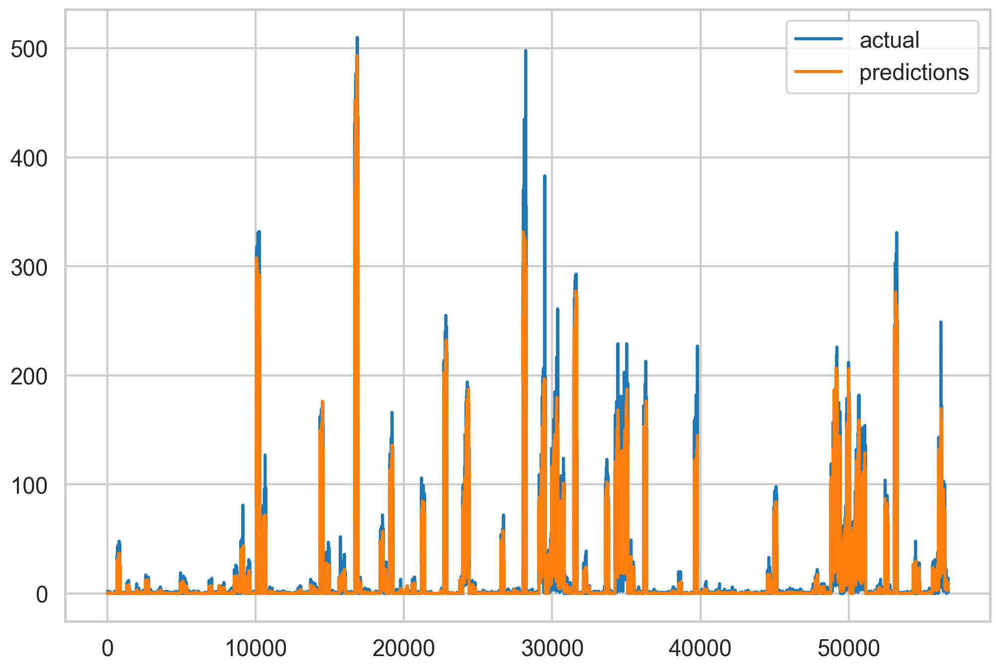

In [9]:
# visualize predictions
import matplotlib.pyplot as plt
import seaborn as sns
# retina display
%config InlineBackend.figure_format = 'retina'

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(12, 8))
plt.plot(y_test, label='actual')
plt.plot(predictions, label='predictions')
plt.legend()
plt.show()

In [10]:
# visualize the predictions using plotly
import plotly.express as px
import plotly.graph_objects as go

# retina display
%config InlineBackend.figure_format = 'retina'

fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test.index, y=y_test, name='actual'))
fig.add_trace(go.Scatter(x=y_test.index, y=predictions, name='predicted'))
fig.update_layout(
    title='Baseline Model - Last 4 Weeks',
    xaxis_title='time',
    yaxis_title='rides'
)
fig.show()

### Feature Importance for 4 weeks of data

In [11]:
# feature importance
import numpy as np

feature_importance = pd.DataFrame(
    model.feature_importances_,
    index=X_train_only_numeric.columns,
    columns=['importance']
)
feature_importance.sort_values('importance', ascending=False, inplace=True)
feature_importance.head(20) 

,importance
rides_previous_336_hour,0.168160
rides_previous_504_hour,0.146645
rides_previous_168_hour,0.138697
rides_previous_1_hour,0.073729
rides_previous_332_hour,0.025460
rides_previous_335_hour,0.008068
rides_previous_672_hour,0.007849
rides_previous_167_hour,0.007287
rides_previous_612_hour,0.006392
rides_previous_24_hour,0.005901


Observation of feature importance for 4 weeks of data:
<br>From the code above, it seems that the most important features are for the last 14(336h) and 21(504h), and 7(168h) days of data.

In [12]:
# use only important features in the model and retrain
important_features = feature_importance[feature_importance['importance'] > 0.001].index # 0.01, 0.02
X_train_important = X_train[important_features]
X_test_important = X_test[important_features]

model_important = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
model_important.fit(X_train_important, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [13]:
important_features

Index(['rides_previous_336_hour', 'rides_previous_504_hour',
       'rides_previous_168_hour', 'rides_previous_1_hour',
       'rides_previous_332_hour', 'rides_previous_335_hour',
       'rides_previous_672_hour', 'rides_previous_167_hour',
       'rides_previous_612_hour', 'rides_previous_24_hour',
       ...
       'rides_previous_33_hour', 'rides_previous_79_hour',
       'rides_previous_103_hour', 'rides_previous_348_hour',
       'rides_previous_594_hour', 'rides_previous_437_hour',
       'rides_previous_215_hour', 'rides_previous_3_hour',
       'rides_previous_174_hour', 'rides_previous_198_hour'],
      dtype='object', length=119)

In [14]:
important_features.size, X_train_important.shape[1], X_test_important.shape[1]

(119, 119, 119)

In [15]:
# evaluate the model
predictions_important = model_important.predict(X_test_important)
test_mae_important = mean_absolute_error(y_test, predictions_important)
print(f'{test_mae_important=}')

test_mae_important=2.534324


In [16]:
# visualize th results
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test.index, y=y_test, name='actual'))
fig.add_trace(go.Scatter(x=y_test.index, y=predictions, name='predicted'))
fig.add_trace(go.Scatter(x=y_test.index, y=predictions_important, name='predicted_important'))
fig.update_layout(
    title='Baseline Model - Last 4 Weeks',
    xaxis_title='time',
    yaxis_title='rides'
)
fig.show()


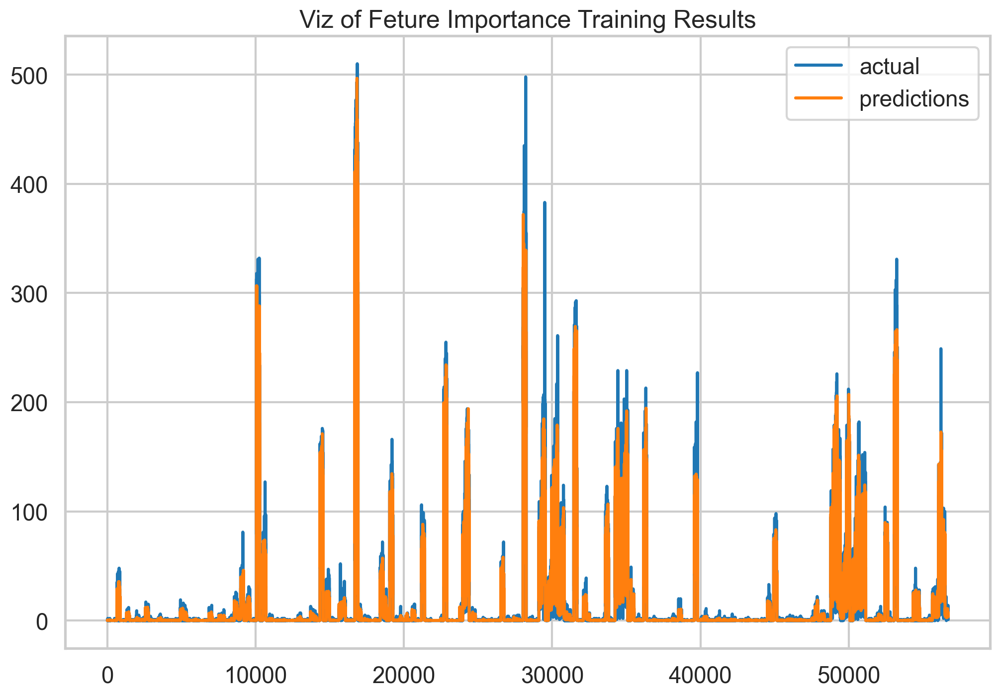

In [19]:
# visualize predictions
import matplotlib.pyplot as plt
import seaborn as sns
# retina display
%config InlineBackend.figure_format = 'retina'

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(12, 8))
plt.plot(y_test, label='actual')
plt.plot(predictions_important, label='predictions')
plt.title('Viz of Feture Importance Training Results') 
plt.legend()
plt.show()

### Summary of feature importance for 4 weeks of data
I've reduced the number of feature to 119 from 674 (5.5 times lesser) and the results of MAE are promising: 
<br> `test_mae_important=2.534324` for feature importance and `test_mae=2.576103` for the original model.

### 8 weeks of data 
To Do:
- [x] Experiment with 8 weeks of data - use the same apporach as 4 weeks of data

In [1]:
import pandas as pd
from src.paths import TRANSFORMED_DATA_DIR

df = pd.read_parquet(TRANSFORMED_DATA_DIR / 'tabular_data_2_months.parquet')
df

,rides_previous_1344_hour,rides_previous_1343_hour,rides_previous_1342_hour,rides_previous_1341_hour,rides_previous_1340_hour,rides_previous_1339_hour,rides_previous_1338_hour,rides_previous_1337_hour,rides_previous_1336_hour,rides_previous_1335_hour,...,rides_previous_7_hour,rides_previous_6_hour,rides_previous_5_hour,rides_previous_4_hour,rides_previous_3_hour,rides_previous_2_hour,rides_previous_1_hour,pickup_hour,pickup_location_id,target_rides_next_hour
0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,2.0,0.0,0.0,...,1.0,2.0,0.0,0.0,0.0,0.0,0.0,2022-02-26,1,1.0
1,0.0,0.0,0.0,0.0,0.0,4.0,1.0,2.0,1.0,2.0,...,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2022-02-27,1,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,3.0,2.0,0.0,2.0,0.0,0.0,0.0,2022-02-28,1,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-03-01,1,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,4.0,0.0,0.0,0.0,0.0,0.0,2022-03-02,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81880,4.0,6.0,0.0,1.0,1.0,7.0,22.0,18.0,25.0,17.0,...,6.0,5.0,3.0,1.0,6.0,1.0,3.0,2022-12-27,265,3.0
81881,2.0,6.0,4.0,2.0,4.0,10.0,16.0,17.0,20.0,12.0,...,4.0,2.0,1.0,2.0,2.0,2.0,8.0,2022-12-28,265,1.0
81882,5.0,1.0,3.0,1.0,2.0,8.0,18.0,9.0,18.0,19.0,...,2.0,3.0,5.0,1.0,1.0,0.0,8.0,2022-12-29,265,3.0
81883,8.0,6.0,3.0,3.0,2.0,8.0,15.0,16.0,8.0,8.0,...,3.0,3.0,1.0,2.0,0.0,1.0,2.0,2022-12-30,265,7.0


In [30]:
from datetime import datetime
from src.data_split import train_test_split

X_train, y_train, X_test, y_test = train_test_split(
    df,
    cutoff_date=datetime(2022, 6, 1, 0, 0, 0), # used '10' instead of '6' to get 4 months(?) of data 
                                                # and get 70% of data for training
    target_column_name='target_rides_next_hour'
)

print(f'{X_train.shape=}')
print(f'{y_train.shape=}')
print(f'{X_test.shape=}')
print(f'{y_test.shape=}')

X_train.shape=(25175, 1346)
y_train.shape=(25175,)
X_test.shape=(56710, 1346)
y_test.shape=(56710,)


In [31]:
# use only past rides data
past_rides_columns = [col for col in X_train.columns if col.startswith('rides_')]
X_train_only_numeric = X_train[past_rides_columns]

In [32]:
import xgboost as xgb

In [33]:
# model
model = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
model.fit(X_train_only_numeric, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [34]:
# predictions
X_test_only_numeric = X_test[past_rides_columns]
predictions = model.predict(X_test_only_numeric)
predictions

array([0.12132487, 0.22735973, 0.12132487, ..., 5.210433  , 6.8475466 ,
       4.186826  ], dtype=float32)

In [35]:
from sklearn.metrics import mean_absolute_error
test_mae = mean_absolute_error(y_test, predictions)
print(f'{test_mae=}')

test_mae=2.7155468


In [36]:
# feature importance
import numpy as np

feature_importance = pd.DataFrame(
    model.feature_importances_,
    index=X_train_only_numeric.columns,
    columns=['importance']
)
feature_importance.sort_values('importance', ascending=False, inplace=True)
feature_importance.head(20) 

,importance
rides_previous_168_hour,0.257950
rides_previous_504_hour,0.140697
rides_previous_336_hour,0.108425
rides_previous_1009_hour,0.028839
rides_previous_1_hour,0.028639
rides_previous_102_hour,0.017318
rides_previous_841_hour,0.012580
rides_previous_672_hour,0.010581
rides_previous_167_hour,0.007783
rides_previous_1176_hour,0.007623


TOP 3
- rides_previous_168_hour =	0.257950
- rides_previous_504_hour = 0.140697
- rides_previous_336_hour = 0.108425

#### Using Feature Importance

In [37]:
# use only important features in the model and retrain
important_features = feature_importance[feature_importance['importance'] > 0.001].index # 0.01, 0.02
X_train_important = X_train[important_features]
X_test_important = X_test[important_features]

model_important = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
model_important.fit(X_train_important, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

Observation 
Training time down from 15 sec to 2 sec.

In [38]:
# what the important features are?
important_features

Index(['rides_previous_168_hour', 'rides_previous_504_hour',
       'rides_previous_336_hour', 'rides_previous_1009_hour',
       'rides_previous_1_hour', 'rides_previous_102_hour',
       'rides_previous_841_hour', 'rides_previous_672_hour',
       'rides_previous_167_hour', 'rides_previous_1176_hour',
       'rides_previous_1008_hour', 'rides_previous_493_hour',
       'rides_previous_337_hour', 'rides_previous_332_hour',
       'rides_previous_1049_hour', 'rides_previous_24_hour',
       'rides_previous_599_hour', 'rides_previous_840_hour',
       'rides_previous_90_hour', 'rides_previous_1043_hour',
       'rides_previous_152_hour', 'rides_previous_229_hour',
       'rides_previous_376_hour', 'rides_previous_1116_hour',
       'rides_previous_1261_hour', 'rides_previous_23_hour',
       'rides_previous_169_hour', 'rides_previous_1174_hour',
       'rides_previous_624_hour', 'rides_previous_626_hour',
       'rides_previous_211_hour', 'rides_previous_1305_hour',
       'rides_previo

In [39]:
# how many important features? 
important_features.size, X_train_important.shape[1], X_test_important.shape[1]

(84, 84, 84)

In [40]:
# evaluate the model
predictions_important = model_important.predict(X_test_important)
test_mae_important = mean_absolute_error(y_test, predictions_important)
print(f'{test_mae_important=}')

test_mae_important=2.6991081


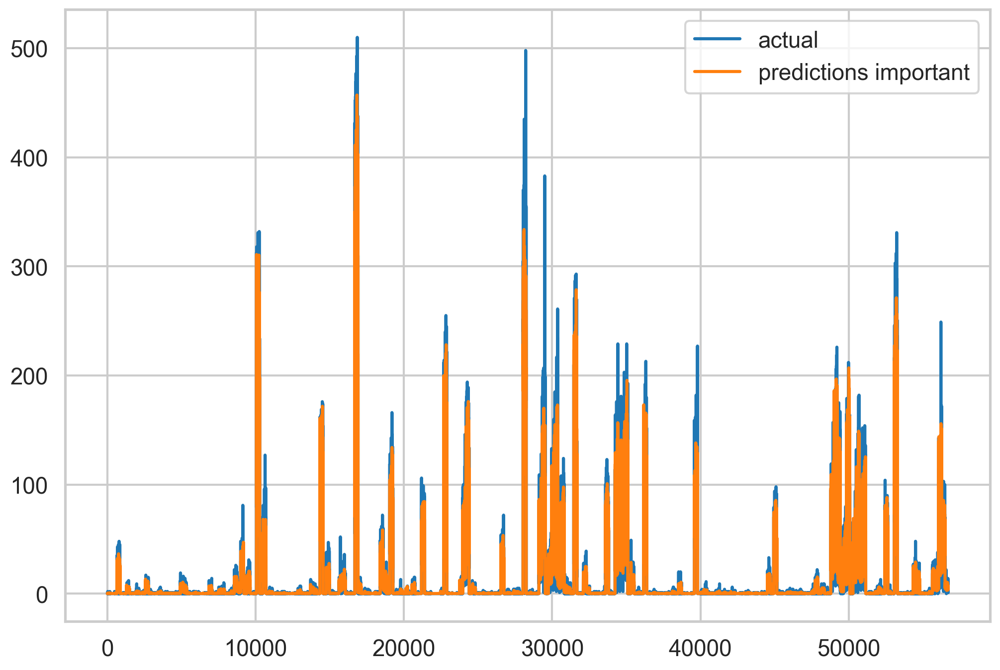

In [41]:
# visualize predictions
import matplotlib.pyplot as plt
import seaborn as sns
# retina display
%config InlineBackend.figure_format = 'retina'

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(12, 8))
plt.plot(y_test, label='actual')
plt.plot(predictions_important, label='predictions important')
plt.legend()
plt.show()

In [42]:
# visualize the predictions using plotly
import plotly.express as px
import plotly.graph_objects as go

# retina display
%config InlineBackend.figure_format = 'retina'

fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test.index, y=y_test, name='actual'))
fig.add_trace(go.Scatter(x=y_test.index, y=predictions_important, name='predicted'))
fig.update_layout(
    title='Baseline Model - Last 8 Weeks Important',
    xaxis_title='time',
    yaxis_title='rides'
)
fig.show()

Feature Importance observation for 8 weeks of data:
From the code above, it seems that the most important features are for the last 7(168h), 14(336h) and 21(504h)  days of data.

### Summary
[w\o feature importance] 
- mae = 2.71
- feature_size = 1347
- train time = 14 sec

[with feature importance] 
- mae_important = 2.69
- feature_size = 84
- train time = 2 sec

## Experiments section
To Do:
- [] Experiment with 16 weeks (4 months) of data - to get the 70\30 split of the train and test data

Notes 
- Experiment with 4 months of data (value = 10 in the train dataset, intead of 6)
  - mae = 2.69
  - mae_important = 2.66

In [45]:
from datetime import datetime
from src.data_split import train_test_split

X_train, y_train, X_test, y_test = train_test_split(
    df,
    cutoff_date=datetime(2022, 10, 1, 0, 0, 0), # used '10' instead of '6' to get 4 months(?) of data 
                                                # and get 70% of data for training
    target_column_name='target_rides_next_hour'
)

print(f'{X_train.shape=}')
print(f'{y_train.shape=}')
print(f'{X_test.shape=}')
print(f'{y_test.shape=}')

X_train.shape=(57505, 1346)
y_train.shape=(57505,)
X_test.shape=(24380, 1346)
y_test.shape=(24380,)


In [43]:
# # visualize important features via SHAP # -> not working
# import shap

# explainer = shap.TreeExplainer(model_important)
# shap_values = explainer.shap_values(X_train_important)

In [44]:
# # visualize the feature importance -> too many features to visualize
# import numpy as np

# feature_importance = model.feature_importances_
# feature_importance = 100.0 * (feature_importance / feature_importance.max())
# sorted_idx = np.argsort(feature_importance)
# pos = np.arange(sorted_idx.shape[0]) + .5

# plt.figure(figsize=(12, 8))
# plt.barh(pos, feature_importance[sorted_idx], align='center')
# plt.yticks(pos, X_train_only_numeric.columns[sorted_idx])
# plt.xlabel('Relative Importance')
# plt.title('Variable Importance')
# plt.show()
